<a href="https://colab.research.google.com/github/Miosa39/Miosa39.github.io/blob/main/Simple_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
__________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


串流輸出內容已截斷至最後 5000 行。
25000 [D loss: 0.691258, acc.: 48.44%] [G loss: 1.033494]
25001 [D loss: 0.708578, acc.: 54.69%] [G loss: 0.940104]
25002 [D loss: 0.578628, acc.: 71.88%] [G loss: 0.990580]
25003 [D loss: 0.655830, acc.: 65.62%] [G loss: 0.975837]
25004 [D loss: 0.581984, acc.: 68.75%] [G loss: 1.016093]
25005 [D loss: 0.692945, acc.: 59.38%] [G loss: 1.052193]
25006 [D loss: 0.718313, acc.: 53.12%] [G loss: 0.947494]
25007 [D loss: 0.611333, acc.: 68.75%] [G loss: 1.089136]
25008 [D loss: 0.559965, acc.: 65.62%] [G loss: 1.126131]
25009 [D loss: 0.615160, acc.: 65.62%] [G loss: 1.077916]
25010 [D loss: 0.613138, acc.: 67.19%] [G loss: 1.096553]
25011 [D loss: 0.630249, acc.: 65.62%] [G loss: 1.123858]
25012 [D loss: 0.625303, acc.: 65.62%] [G loss: 1.032101]
25013 [D loss: 0.634867, acc.: 56.25%] [G loss: 1.048583]
25014 [D loss: 0.645569, acc.: 65.62%] [G loss: 0.981681]
25015 [D loss: 0.624367, acc.: 68.75%] [G loss: 0.880491]
25016 [D loss: 0.598992, acc.: 68.75%] [G loss: 1.0

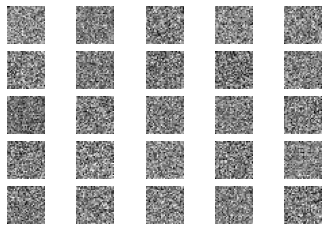

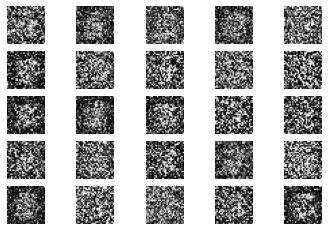

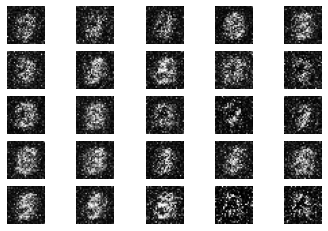

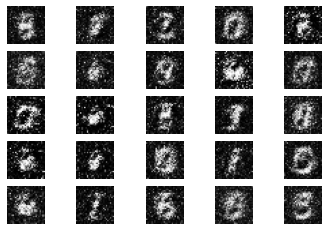

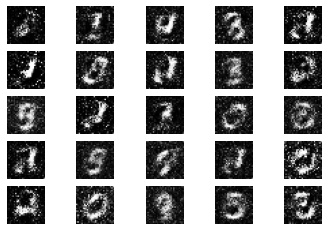

...

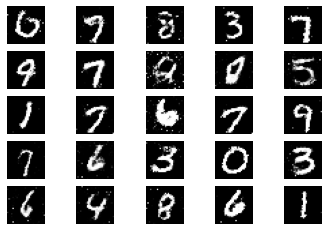

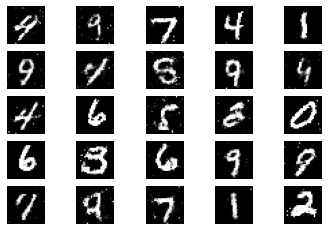

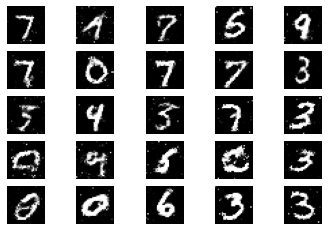

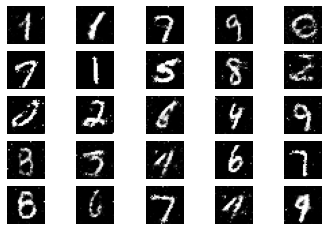

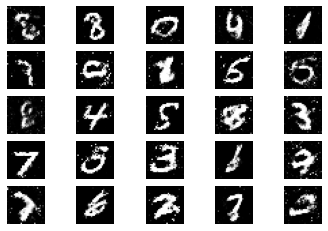

In [1]:
from __future__ import print_function, division

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam

import matplotlib.pyplot as plt

import sys

import numpy as np

class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png"%epoch)
        #plt.close()


if __name__ == '__main__':
    gan = GAN()
    gan.train(epochs=30000, batch_size=32, sample_interval=200)

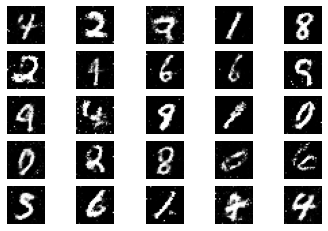

In [4]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r * c, 100))
gen_imgs = gan.generator.predict(noise)
# Rescale images 0 - 1
gen_imgs = 0.5 * gen_imgs + 0.5

fig, axs = plt.subplots(r, c)
cnt = 0
for i in range(r):
    for j in range(c):
        axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
        axs[i,j].axis('off')
        cnt += 1


In [5]:
from platform import python_version
print( 'Python Version: ', python_version() )

Python Version:  3.6.9


0 [D loss: 0.583675, acc.: 68.75%] [G loss: 0.997278]
1 [D loss: 0.609710, acc.: 64.06%] [G loss: 0.945629]
2 [D loss: 0.639153, acc.: 59.38%] [G loss: 0.968172]
3 [D loss: 0.585787, acc.: 70.31%] [G loss: 0.934819]
4 [D loss: 0.645425, acc.: 70.31%] [G loss: 1.011760]
5 [D loss: 0.639367, acc.: 62.50%] [G loss: 1.025320]
6 [D loss: 0.673842, acc.: 57.81%] [G loss: 1.012154]
7 [D loss: 0.710243, acc.: 56.25%] [G loss: 0.972905]
8 [D loss: 0.692363, acc.: 54.69%] [G loss: 1.041143]
9 [D loss: 0.579310, acc.: 65.62%] [G loss: 0.979468]
10 [D loss: 0.685188, acc.: 56.25%] [G loss: 0.908963]
11 [D loss: 0.690746, acc.: 59.38%] [G loss: 1.030857]
12 [D loss: 0.660163, acc.: 60.94%] [G loss: 1.110028]
13 [D loss: 0.631456, acc.: 62.50%] [G loss: 1.154385]
14 [D loss: 0.678340, acc.: 59.38%] [G loss: 1.006455]
15 [D loss: 0.640749, acc.: 59.38%] [G loss: 0.945273]
16 [D loss: 0.701613, acc.: 50.00%] [G loss: 1.089478]
17 [D loss: 0.588507, acc.: 73.44%] [G loss: 0.937874]
18 [D loss: 0.632893

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


串流輸出內容已截斷至最後 5000 行。
5000 [D loss: 0.619429, acc.: 65.62%] [G loss: 1.014313]
5001 [D loss: 0.584955, acc.: 70.31%] [G loss: 1.041497]
5002 [D loss: 0.656578, acc.: 59.38%] [G loss: 1.116425]
5003 [D loss: 0.682631, acc.: 59.38%] [G loss: 1.174220]
5004 [D loss: 0.599114, acc.: 67.19%] [G loss: 1.040766]
5005 [D loss: 0.622472, acc.: 64.06%] [G loss: 0.988292]
5006 [D loss: 0.591287, acc.: 67.19%] [G loss: 0.948554]
5007 [D loss: 0.617505, acc.: 65.62%] [G loss: 1.039878]
5008 [D loss: 0.599406, acc.: 68.75%] [G loss: 0.993967]
5009 [D loss: 0.610199, acc.: 64.06%] [G loss: 1.001557]
5010 [D loss: 0.574125, acc.: 73.44%] [G loss: 1.019149]
5011 [D loss: 0.620504, acc.: 60.94%] [G loss: 1.046941]
5012 [D loss: 0.642976, acc.: 70.31%] [G loss: 1.144722]
5013 [D loss: 0.586167, acc.: 67.19%] [G loss: 0.948398]
5014 [D loss: 0.746780, acc.: 45.31%] [G loss: 1.035505]
5015 [D loss: 0.692144, acc.: 62.50%] [G loss: 0.980840]
5016 [D loss: 0.629741, acc.: 67.19%] [G loss: 1.071219]
5017 [D lo

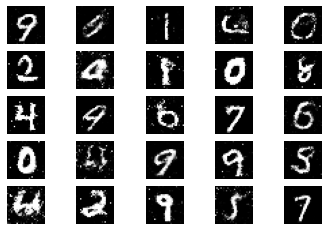

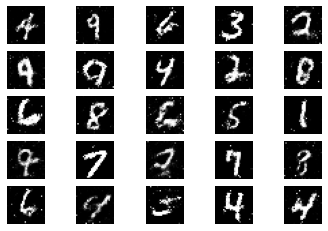

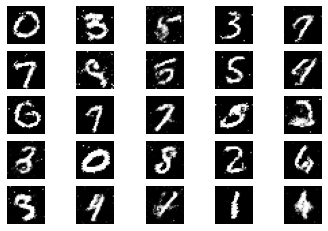

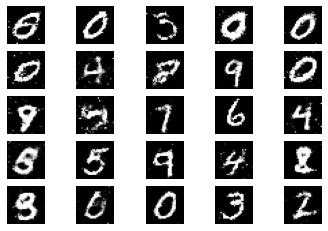

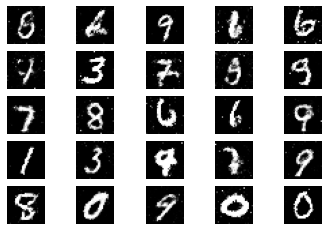

...

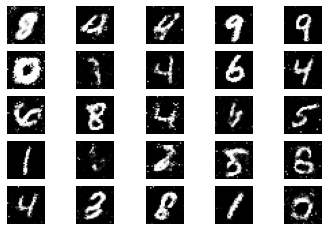

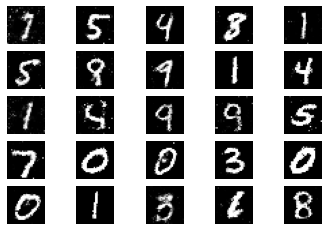

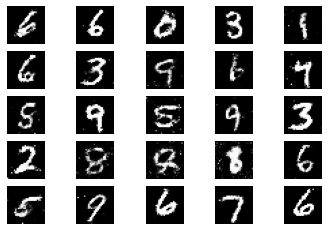

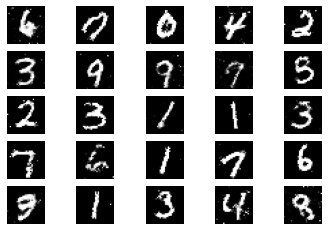

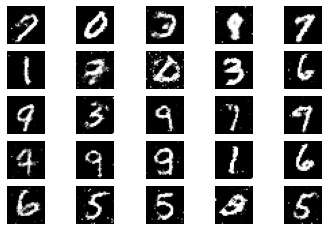

In [6]:
gan.train(epochs=10000, batch_size=32, sample_interval=200)

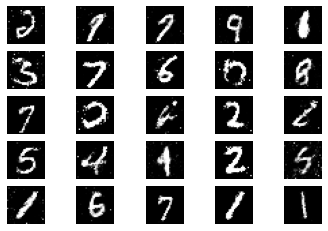

In [11]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r * c, 100))
gen_imgs = gan.generator.predict(noise)
# Rescale images 0 - 1
gen_imgs = 0.5 * gen_imgs + 0.5

fig, axs = plt.subplots(r, c)
cnt = 0
for i in range(r):
    for j in range(c):
        axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
        axs[i,j].axis('off')
        cnt += 1
